In [0]:
from fastai.text import *

In [0]:
from google.colab import drive
drive.mount('/content/drive')

Go to this URL in a browser: https://accounts.google.com/o/oauth2/auth?client_id=947318989803-6bn6qk8qdgf4n4g3pfee6491hc0brc4i.apps.googleusercontent.com&redirect_uri=urn%3Aietf%3Awg%3Aoauth%3A2.0%3Aoob&scope=email%20https%3A%2F%2Fwww.googleapis.com%2Fauth%2Fdocs.test%20https%3A%2F%2Fwww.googleapis.com%2Fauth%2Fdrive%20https%3A%2F%2Fwww.googleapis.com%2Fauth%2Fdrive.photos.readonly%20https%3A%2F%2Fwww.googleapis.com%2Fauth%2Fpeopleapi.readonly&response_type=code

Enter your authorization code:
··········
Mounted at /content/drive


In [0]:


%reload_ext autoreload
%autoreload 2
%matplotlib inline
bs=48



In [0]:
import zipfile
from google.colab import drive

drive.mount('/content/drive/')

zip_ref = zipfile.ZipFile("/content/drive/My Drive/upload (1).zip", 'r')
zip_ref.extractall("/tmp")
zip_ref.close()

Drive already mounted at /content/drive/; to attempt to forcibly remount, call drive.mount("/content/drive/", force_remount=True).


BadZipFile: ignored

In [0]:
!unzip "/content/drive/My Drive/upload (1).zip"

Archive:  /content/drive/My Drive/upload (1).zip
warning [/content/drive/My Drive/upload (1).zip]:  76 extra bytes at beginning or within zipfile
  (attempting to process anyway)
error [/content/drive/My Drive/upload (1).zip]:  reported length of central directory is
  -76 bytes too long (Atari STZip zipfile?  J.H.Holm ZIPSPLIT 1.1
  zipfile?).  Compensating...
  inflating: upload/news_test.json   
   creating: upload/train/
   creating: upload/train/ARTS & CULTURE/
  inflating: upload/train/ARTS & CULTURE/10115.txt  
  inflating: upload/train/ARTS & CULTURE/10234.txt  
  inflating: upload/train/ARTS & CULTURE/10323.txt  
  inflating: upload/train/ARTS & CULTURE/10371.txt  
  inflating: upload/train/ARTS & CULTURE/10372.txt  
  inflating: upload/train/ARTS & CULTURE/10491.txt  
  inflating: upload/train/ARTS & CULTURE/10510.txt  
  inflating: upload/train/ARTS & CULTURE/10564.txt  
  inflating: upload/train/ARTS & CULTURE/10629.txt  
  inflating: upload/train/ARTS & CULTURE/10821.txt  

In [0]:
data_lm = (TextList.from_folder("/content/upload")
           #Inputs: all the text files in path
           
          
           #We may have other temp folders that contain text files so we only keep what's in train and test
            .split_by_rand_pct(0.1)
           #We randomly split and keep 10% (10,000 reviews) for validation
            .label_for_lm()           
           #We want to do a language model so we label accordingly
            .databunch(bs=bs))

In [0]:
data_lm.show_batch()

idx,text
0,"xxmaj adorable xxmaj brace xxmaj face xxmaj you 'll xxmaj ever xxmaj see \n xxmaj say cheese ! xxbos xxmaj instead xxmaj of b - xxmaj day xxmaj gifts , xxmaj this xxmaj boy xxmaj asks xxmaj for xxmaj shoes xxmaj for xxmaj people xxmaj in xxmaj need \n xxmaj he 's donated 600 pairs so far . xxbos xxmaj man xxmaj finds xxmaj home xxmaj videos xxmaj"
1,"go , you got ta go . xxmaj in a video that is making the rounds on the xxmaj internet ( despite first xxbos xxmaj yes , i xxmaj really xxmaj am xxmaj bisexual . xxmaj deal xxmaj with xxmaj it . \n xxmaj when i told xxmaj jared i 'm bisexual , he could n't , or at least did n't , hide his discomfort . xxmaj read"
2,"xxmaj work , work ! xxbos xxmaj jonathan xxmaj franzen xxmaj demonstrates xxmaj his xxmaj spirit xxmaj animal xxmaj is xxmaj lucille xxmaj bluth \n "" xxmaj maybe i 'll get a son who xxup will finish his cottage cheese ! "" xxbos xxmaj this xxmaj theatre xxmaj group xxmaj performs xxmaj shakespeare , xxmaj only xxmaj xxunk \n xxmaj think : a mix of faithful deliveries of"
3,"two xxmaj years \n xxmaj innocent people may have been jailed , and guilty ones may go free . xxbos xxmaj what xxmaj the xxmaj ebola xxmaj crisis xxmaj can xxmaj teach xxmaj us xxmaj about xxmaj responding xxmaj to xxmaj the xxmaj zika xxmaj outbreak \n xxmaj two public health experts explain what the world needs to do better this time . xxbos xxmaj australia xxmaj says"
4,"xxmaj not xxmaj one \n xxmaj the long - necked mammal has long been thought of as a single species . xxmaj but that 's a tall tale , new research shows . xxbos xxmaj this xxmaj is xxmaj what xxmaj pollution xxmaj looks xxmaj like xxmaj in xxmaj your xxmaj world \n xxbos xxmaj judge xxmaj throws xxmaj out xxmaj lawsuit xxmaj against xxmaj crude xxmaj by"


In [0]:


learn = language_model_learner(data_lm, AWD_LSTM, drop_mult=0.3)



In [0]:
learn.lr_find()

LR Finder is complete, type {learner_name}.recorder.plot() to see the graph.


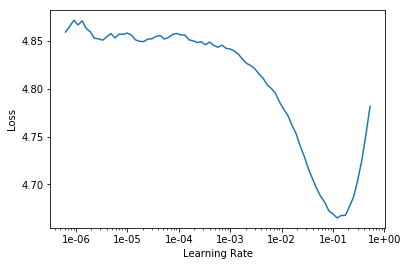

In [0]:


learn.recorder.plot(skip_end=15)



In [0]:
learn.fit_one_cycle(1, 1e-2, moms=(0.8,0.7))

epoch,train_loss,valid_loss,accuracy,time
0,3.660396,3.517632,0.407008,17:07


In [0]:
learn.save('fit_head')

In [0]:
learn.load('fit_head');

In [0]:
learn.unfreeze()

In [0]:
learn.fit_one_cycle(2, 1e-3, moms=(0.8,0.7))

epoch,train_loss,valid_loss,accuracy,time
0,3.271344,3.279695,0.435729,19:42
1,3.091650,3.209347,0.445126,19:41


In [0]:
learn.save('fine_tuned')

In [0]:
learn.save_encoder('fine_tuned_enc')

In [0]:




data_clas = (TextList.from_folder("/content/upload", vocab=data_lm.vocab)
             #grab all the text files in path
             .filter_by_folder(include=['train']) 
             .split_by_rand_pct(0.1)
             
             
             #split by train and valid folder (that only keeps 'train' and 'test' so no need to filter)
             .label_from_folder(classes=['ARTS','ARTS & CULTURE','BLACK VOICES','BUSINESS','COLLEGE','COMEDY','CRIME','CULTURE & ARTS','DIVORCE','EDUCATION','ENTERTAINMENT','FIFTY','FOOD & DRINK','GOOD NEWS','GREEN','HEALTHY LIVING','HOME & LIVING','IMPACT','LATINO VOICES','MEDIA','MONEY','PARENTS','POLITICS','QUEER VOICES','RELIGION','SCIENCE','SPORTS','STYLE','STYLE & BEAUTY','TASTE','TECH','TRAVEL','WEDDINGS','WEIRD NEWS','WELLNESS','WOMEN','WORLD NEWS','WORLDPOST'])
             #label them all with their folders
             .databunch(bs=bs))

/usr/local/lib/python3.6/dist-packages/fastai/data_block.py:534: UserWarning: You are labelling your items with CategoryList.
Your train set contained the following unknown labels, the corresponding items have been discarded.
PARENTING, ENVIRONMENT, THE WORLDPOST
  if getattr(ds, 'warn', False): warn(ds.warn)
/usr/local/lib/python3.6/dist-packages/fastai/data_block.py:534: UserWarning: You are labelling your items with CategoryList.
Your valid set contained the following unknown labels, the corresponding items have been discarded.
PARENTING, ENVIRONMENT, THE WORLDPOST
  if getattr(ds, 'warn', False): warn(ds.warn)


In [0]:
data_clas.show_batch()

text,target
"xxbos xxmaj sunday xxmaj roundup \n xxmaj this week the nation watched as the # nevertrump movement folded faster than one of the presumptive nominee 's beachfront developments . xxmaj as many tried to explain away xxmaj trump 's reckless , racist extremism , a few put principle over party . xxmaj the wife of former xxmaj republican xxmaj senator xxmaj bob xxmaj bennett , who died on xxmaj",POLITICS
"xxbos xxmaj sunday xxmaj roundup \n xxmaj this week began the way so many do : with more tragic gun violence , as three people were killed in two shootings at xxmaj jewish centers in the xxmaj kansas xxmaj city area , part of the 86 killed by guns in the xxup u.s. every day . "" xxmaj we are united in our condemnation of this heinous attack ,",POLITICS
"xxbos xxmaj weekend xxmaj roundup \n xxmaj this week , while the xxup u.s. celebrates its independence , the world watches a modern xxmaj greek tragedy unfold as xxmaj greece votes on austere bailout terms imposed by the country 's creditors . xxmaj however the vote goes , one thing is clear : xxmaj the austerity that came with the two previous bailouts has utterly broken the xxmaj greek",POLITICS
"xxbos xxmaj pay xxmaj dirt or xxmaj fool 's xxmaj gold ? xxmaj panning in xxmaj fairbanks : xxmaj to xxmaj denali and xxmaj fairbanks on the xxmaj looney xxmaj front , xxmaj part 4 \n xxmaj yes , we 're panning for gold at xxmaj gold xxmaj dredge 8 just outside xxmaj fairbanks , and xxmaj yours xxmaj truly -- of course -- is doing it all wrong",TRAVEL
"xxbos xxmaj planning a xxmaj big xxmaj surprise xxmaj wedding for the xxmaj bride xxmaj is xxup not a xxmaj good xxmaj idea \n xxmaj okay , that 's it . i 'm calling xxup bullsh*t on "" secret "" and "" surprise "" weddings . i do n't mean you ca n't have elements of surprise for your future spouse but i 'm saying that deciding to plan",WEDDINGS


In [0]:
learn = text_classifier_learner(data_clas, AWD_LSTM, drop_mult=0.5)
learn.load_encoder('fine_tuned_enc')

In [0]:
learn.lr_find()

LR Finder is complete, type {learner_name}.recorder.plot() to see the graph.


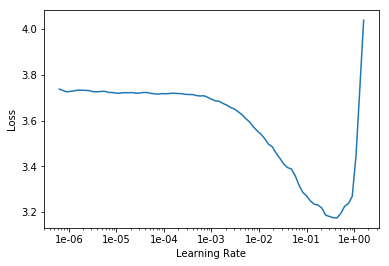

In [0]:


learn.recorder.plot()



In [0]:


learn.fit_one_cycle(1, 1e-2, moms=(0.8,0.7))



epoch,train_loss,valid_loss,accuracy,time
0,1.561677,1.278096,0.622476,05:35


In [0]:
learn.predict("Ireland Votes To Repeal Abortion Amendment In Landslide Referendum")

(Category POLITICS,
 tensor(22),
 tensor([3.2680e-04, 2.1291e-04, 2.0600e-04, 4.3641e-03, 7.7469e-04, 3.6684e-03,
         1.2207e-03, 1.3242e-04, 2.2496e-03, 8.4077e-04, 2.5320e-03, 1.8966e-03,
         1.0135e-04, 3.4727e-04, 9.7226e-04, 5.3930e-03, 1.3040e-04, 3.5307e-03,
         1.1974e-02, 2.1531e-03, 3.5753e-04, 1.0881e-03, 6.5825e-01, 3.6118e-02,
         3.3037e-03, 2.6449e-04, 5.9437e-03, 8.1216e-04, 2.2249e-03, 1.2030e-04,
         4.0796e-04, 5.2054e-03, 3.7976e-04, 1.4321e-03, 2.6744e-03, 4.3398e-03,
         7.8945e-02, 1.5510e-01]))

In [0]:


learn.save('first')



In [0]:
learn.load('first');

In [0]:
learn.freeze_to(-2)
learn.fit_one_cycle(1, slice(1e-2/(2.6**4),1e-2), moms=(0.8,0.7))

epoch,train_loss,valid_loss,accuracy,time
0,1.347775,1.132593,0.664921,06:07


In [0]:
learn.save('second')

In [0]:
learn.load('second');

In [0]:
learn.freeze_to(-3)
learn.fit_one_cycle(1, slice(5e-3/(2.6**4),5e-3), moms=(0.8,0.7))

epoch,train_loss,valid_loss,accuracy,time
0,1.234115,1.040891,0.685241,10:53


In [0]:
learn.save('third')

In [0]:


learn.load('third');



In [0]:
learn.unfreeze()
learn.fit_one_cycle(2, slice(1e-3/(2.6**4),1e-3), moms=(0.8,0.7))

epoch,train_loss,valid_loss,accuracy,time
0,1.096364,1.024073,0.692658,14:22
1,1.002784,1.010840,0.694902,15:07


In [0]:
learn.predict("Sheila Dikshit dies at 81, Delhi govt declares 2-day state mourning,indian politics")

(Category WORLDPOST,
 tensor(37),
 tensor([0.0148, 0.0043, 0.0355, 0.0122, 0.0073, 0.0007, 0.0092, 0.0266, 0.0004,
         0.0078, 0.0208, 0.0005, 0.0058, 0.0009, 0.0124, 0.0036, 0.0012, 0.0991,
         0.0135, 0.1154, 0.0004, 0.0012, 0.0577, 0.0085, 0.0389, 0.0039, 0.0198,
         0.0011, 0.0051, 0.0020, 0.0054, 0.0188, 0.0005, 0.0015, 0.0281, 0.0045,
         0.1080, 0.3029]))

In [0]:
import json
import csv
count = 0
f=open('/content/upload/news_test.json',encoding='utf-8')
count=0
for line in f:
    emp=json.loads(line)
    print(str(count)+",",end="")
    print(learn.predict(emp['headline']+'\n'+emp['short_description'])[0])
    count=count+1
    
f.close()

0,IMPACT
1,WELLNESS
2,PARENTS
3,COMEDY
4,COMEDY
5,TRAVEL
6,DIVORCE
7,PARENTS
8,STYLE & BEAUTY
9,STYLE & BEAUTY
10,WELLNESS
11,PARENTS
12,HOME & LIVING
13,HOME & LIVING
14,HOME & LIVING
15,WELLNESS
16,FOOD & DRINK
17,TRAVEL
18,FOOD & DRINK
19,TRAVEL
20,FOOD & DRINK
21,STYLE & BEAUTY
22,HEALTHY LIVING
23,TRAVEL
24,TRAVEL
25,TRAVEL
26,STYLE & BEAUTY
27,WELLNESS
28,STYLE & BEAUTY
29,DIVORCE
30,TRAVEL
31,TRAVEL
32,COMEDY
33,BUSINESS
34,PARENTS
35,CRIME
36,CRIME
37,STYLE & BEAUTY
38,SCIENCE
39,SCIENCE
40,WELLNESS
41,QUEER VOICES
42,QUEER VOICES
43,QUEER VOICES
44,POLITICS
45,PARENTS
46,IMPACT
47,WELLNESS
48,ENTERTAINMENT
49,POLITICS
50,TECH
51,BUSINESS
52,BUSINESS
53,TECH
54,TECH
55,TECH
56,TECH
57,POLITICS
58,ENTERTAINMENT
59,ARTS
60,WELLNESS
61,ENTERTAINMENT
62,WELLNESS
63,GREEN
64,GREEN
65,GREEN
66,GREEN
67,GREEN
68,SCIENCE
69,CULTURE & ARTS
70,CULTURE & ARTS
71,QUEER VOICES
72,CULTURE & ARTS
73,CULTURE & ARTS
74,FOOD & DRINK
75,SPORTS
76,SPORTS
77,STYLE & BEAUTY
78,SPORTS
79,FOOD & DRINK